# Sat2Map

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [2]:
# !wget http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/maps.tar.gz
# !tar -xvf maps.tar.gz

In [3]:
def crop(image, new_shape):
    '''
    Function for cropping an image tensor: Given an image tensor and the new shape,
    crops to the center pixels.
    '''
    middle_height = image.shape[2] // 2
    middle_width = image.shape[3] // 2
    starting_height = middle_height - round(new_shape[2] / 2)
    final_height = starting_height + new_shape[2]
    starting_width = middle_width - round(new_shape[3] / 2)
    final_width = starting_width + new_shape[3]
    cropped_image = image[:, :, starting_height:final_height, starting_width:final_width]
    return cropped_image

class ContractingBlock(nn.Module):
    '''
    ContractingBlock Class
    Performs two convolutions followed by a max pool operation.
    '''
    def __init__(self, input_channels, use_dropout=False, use_bn=True):
        super(ContractingBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels * 2, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(input_channels * 2, input_channels * 2, kernel_size=3, padding=1)
        self.activation = nn.LeakyReLU(0.2)
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        if use_bn:
            self.batchnorm = nn.BatchNorm2d(input_channels * 2)
        self.use_bn = use_bn
        if use_dropout:
            self.dropout = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x):
        '''
        Function for completing a forward pass of ContractingBlock: 
        Given an image tensor, completes a contracting block and returns the transformed tensor.
        '''
        x = self.conv1(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.conv2(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.maxpool(x)
        return x

class ExpandingBlock(nn.Module):
    '''
    ExpandingBlock Class:
    Performs an upsampling, a convolution, a concatenation of its two inputs,
    followed by two more convolutions with optional dropout
    '''
    def __init__(self, input_channels, use_dropout=False, use_bn=True):
        super(ExpandingBlock, self).__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv1 = nn.Conv2d(input_channels, input_channels // 2, kernel_size=2)
        self.conv2 = nn.Conv2d(input_channels, input_channels // 2, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(input_channels // 2, input_channels // 2, kernel_size=2, padding=1)
        if use_bn:
            self.batchnorm = nn.BatchNorm2d(input_channels // 2)
        self.use_bn = use_bn
        self.activation = nn.ReLU()
        if use_dropout:
            self.dropout = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x, skip_con_x):
        '''
        Function for completing a forward pass of ExpandingBlock: 
        Given an image tensor, completes an expanding block and returns the transformed tensor.
        '''
        x = self.upsample(x)
        x = self.conv1(x)
        skip_con_x = crop(skip_con_x, x.shape)
        x = torch.cat([x, skip_con_x], axis=1)
        x = self.conv2(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.conv3(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        return x

class FeatureMapBlock(nn.Module):
    '''
    FeatureMapBlock Class
    The final layer of a U-Net - 
    maps each pixel to a pixel with the correct number of output dimensions
    using a 1x1 convolution.
    '''
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=1)

    def forward(self, x):
        '''
        Function for completing a forward pass of FeatureMapBlock: 
        Given an image tensor, returns it mapped to the desired number of channels.
        '''
        x = self.conv(x)
        return x

class UNet(nn.Module):
    '''
    UNet Class
    A series of 4 contracting blocks followed by 4 expanding blocks to 
    transform an input image into the corresponding paired image, with an upfeature
    layer at the start and a downfeature layer at the end.
    '''
    def __init__(self, input_channels, output_channels, hidden_channels=32):
        super(UNet, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_dropout=True)
        self.contract2 = ContractingBlock(hidden_channels * 2, use_dropout=True)
        self.contract3 = ContractingBlock(hidden_channels * 4, use_dropout=True)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        self.contract5 = ContractingBlock(hidden_channels * 16)
        self.contract6 = ContractingBlock(hidden_channels * 32)
        self.expand0 = ExpandingBlock(hidden_channels * 64)
        self.expand1 = ExpandingBlock(hidden_channels * 32)
        self.expand2 = ExpandingBlock(hidden_channels * 16)
        self.expand3 = ExpandingBlock(hidden_channels * 8)
        self.expand4 = ExpandingBlock(hidden_channels * 4)
        self.expand5 = ExpandingBlock(hidden_channels * 2)
        self.downfeature = FeatureMapBlock(hidden_channels, output_channels)
        self.sigmoid = torch.nn.Sigmoid()

    def forward(self, x):
        '''
        Function for completing a forward pass of UNet: 
        Given an image tensor, passes it through U-Net and returns the output.
        '''
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        x5 = self.contract5(x4)
        x6 = self.contract6(x5)
        x7 = self.expand0(x6, x5)
        x8 = self.expand1(x7, x4)
        x9 = self.expand2(x8, x3)
        x10 = self.expand3(x9, x2)
        x11 = self.expand4(x10, x1)
        x12 = self.expand5(x11, x0)
        xn = self.downfeature(x12)
        return self.sigmoid(xn)

In [4]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Structured like the contracting path of the U-Net, the discriminator will
    output a matrix of values classifying corresponding portions of the image as real or fake.
    '''
    def __init__(self, input_channels, hidden_channels=8):
        super(Discriminator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_bn=False)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        self.contract3 = ContractingBlock(hidden_channels * 4)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        self.final = nn.Conv2d(hidden_channels * 16,1, kernel_size=1)

    def forward(self, x, y):
        x = torch.cat([x, y], axis=1)
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        xn = self.final(x4)
        return xn

In [5]:
import torch.nn.functional as F
# New parameters
'''
Training Prepration:
    real_dim: the number of channels of the real image and the number expected in the output image
    adv_criterion: an adversarial loss function to keep track of how well the GAN is fooling the discriminator and how well the discriminator is catching the GAN
    recon_criterion: a loss function that rewards similar images to the ground truth, which "reconstruct" the image
    lambda_recon: a parameter for how heavily the reconstruction loss should be weighed
    n_epochs: the number of times you iterate through the entire dataset when training
    input_dim: the number of channels of the input image
    display_step: how often to display/visualize the images
    batch_size: the number of images per forward/backward pass
    lr: the learning rate
    target_shape: the size of the output image (in pixels)
    device: the device type
'''
adv_criterion = nn.BCEWithLogitsLoss() 
recon_criterion = nn.L1Loss() 
lambda_recon = 200

n_epochs = 20
input_dim = 3
real_dim = 3
display_step = 200
batch_size = 4
lr = 0.0002
target_shape = 256
device = 'cuda'

You will then pre-process the images of the dataset to make sure they're all the same size and that the size change due to U-Net layers is accounted for. 

In [6]:
transform = transforms.Compose([
    transforms.ToTensor(),
])

import torchvision
dataset = torchvision.datasets.ImageFolder("maps", transform=transform)

In [7]:
gen = UNet(input_dim, real_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(input_dim + real_dim).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

#If training from scratch change pretrained =False
pretrained = True
if pretrained:
    loaded_state = torch.load("pix2pix_800.pth")
    gen.load_state_dict(loaded_state["gen"])
    gen_opt.load_state_dict(loaded_state["gen_opt"])
    disc.load_state_dict(loaded_state["disc"])
    disc_opt.load_state_dict(loaded_state["disc_opt"])
else:
    gen = gen.apply(weights_init)
    disc = disc.apply(weights_init)

While there are some changes to the U-Net architecture for Pix2Pix, the most important distinguishing feature of Pix2Pix is its adversarial loss. You will be implementing that here!

In [8]:
def get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon):
    '''
    Return the loss of the generator given inputs.
    '''
    fake_img = gen(condition)
    fake_pred = disc(fake_img, condition)
    gen_loss = adv_criterion(fake_pred, torch.ones_like(fake_pred)) + lambda_recon*recon_criterion(real,fake_img)
    return gen_loss

## Training

Pretrained initial state


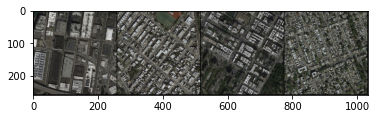

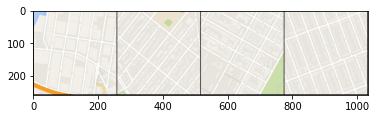

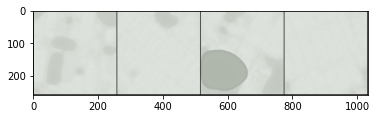

Epoch 0: Step 200: Generator (U-Net) loss: 14.689046263694747, Discriminator loss: 0.10850344600155953


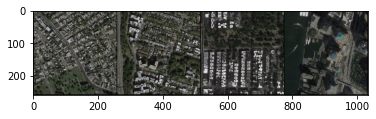

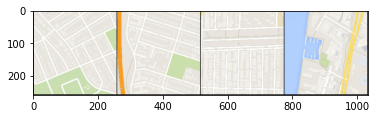

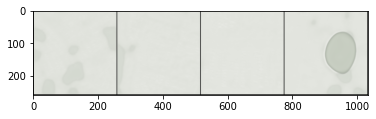

Epoch 0: Step 400: Generator (U-Net) loss: 14.53746676921844, Discriminator loss: 0.11289308572188021


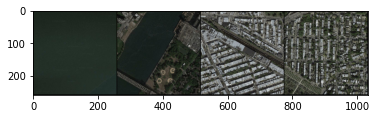

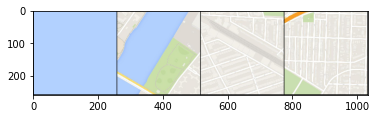

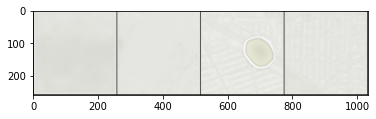

Epoch 1: Step 600: Generator (U-Net) loss: 14.139902739524848, Discriminator loss: 0.04983341815881431


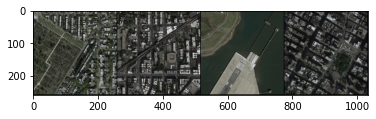

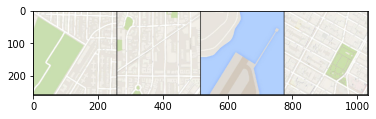

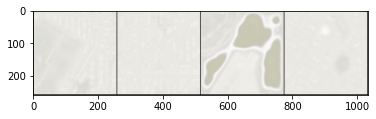

Epoch 1: Step 800: Generator (U-Net) loss: 14.704532527923593, Discriminator loss: 0.052422464173287164


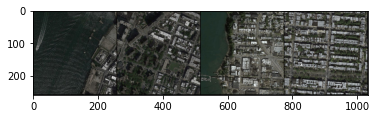

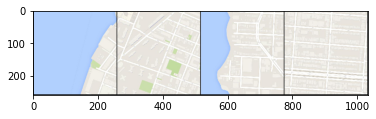

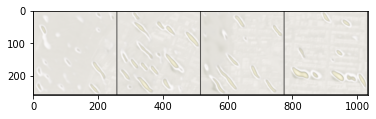

Epoch 1: Step 1000: Generator (U-Net) loss: 14.00412711143493, Discriminator loss: 0.15530502157285803


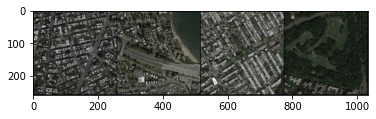

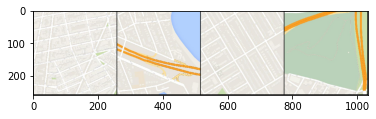

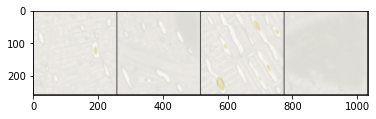

Epoch 2: Step 1200: Generator (U-Net) loss: 14.559279036521916, Discriminator loss: 0.08511970484629272


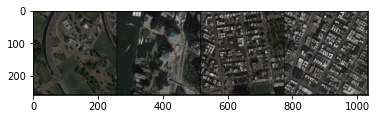

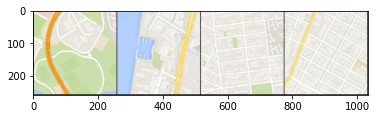

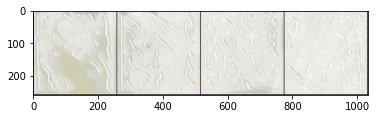

Epoch 2: Step 1400: Generator (U-Net) loss: 14.634919996261596, Discriminator loss: 0.14921961836516856


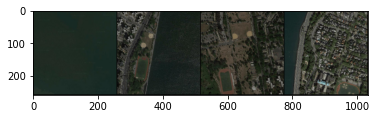

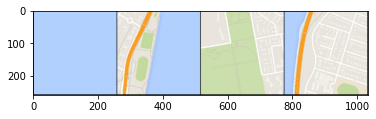

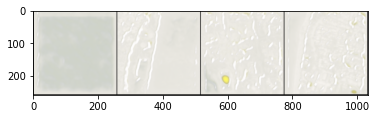

Epoch 2: Step 1600: Generator (U-Net) loss: 13.707314558029177, Discriminator loss: 0.17471556656993936


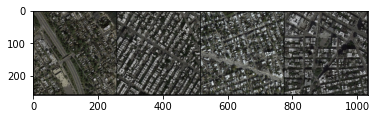

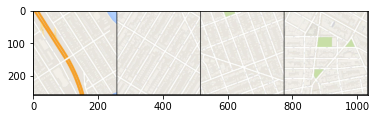

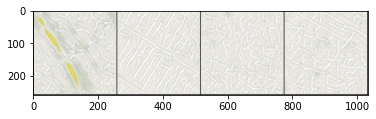

Epoch 3: Step 1800: Generator (U-Net) loss: 12.904068274497993, Discriminator loss: 0.3094627276994287


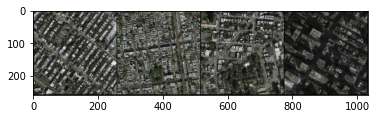

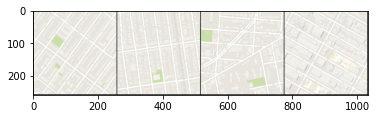

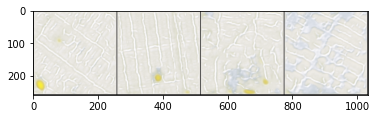

Epoch 3: Step 2000: Generator (U-Net) loss: 13.305825061798087, Discriminator loss: 0.20843926378525793


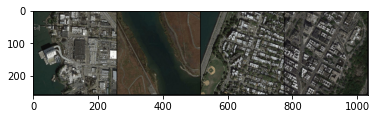

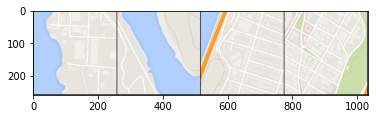

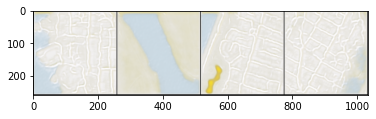

Epoch 4: Step 2200: Generator (U-Net) loss: 12.413715465068828, Discriminator loss: 0.2730879484675824


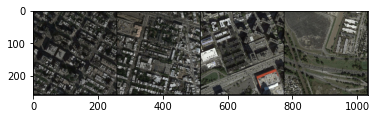

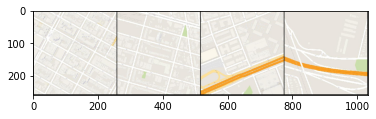

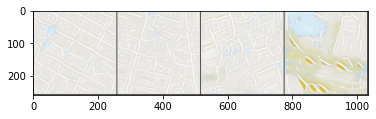

Epoch 4: Step 2400: Generator (U-Net) loss: 11.926246981620785, Discriminator loss: 0.3602542414329949


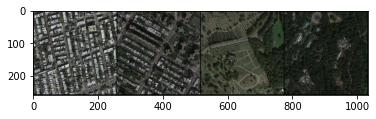

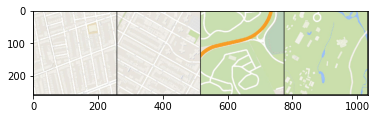

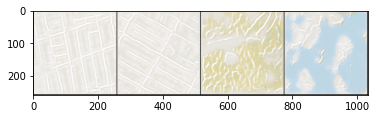

Epoch 4: Step 2600: Generator (U-Net) loss: 11.554818980693819, Discriminator loss: 0.34513340367004286


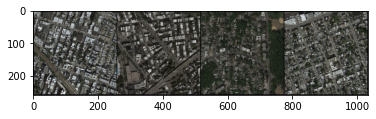

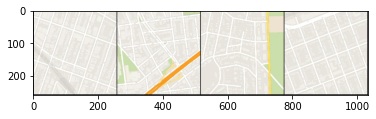

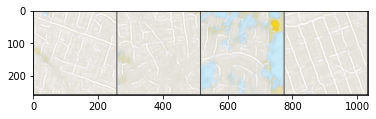

Epoch 5: Step 2800: Generator (U-Net) loss: 11.161244251728062, Discriminator loss: 0.3489807125739754


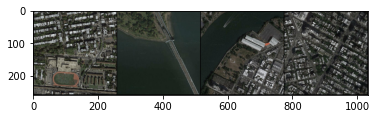

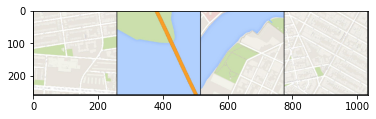

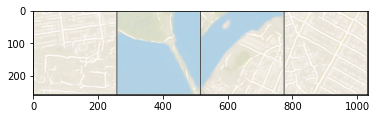

Epoch 5: Step 3000: Generator (U-Net) loss: 10.241488025188445, Discriminator loss: 0.6044382392428818


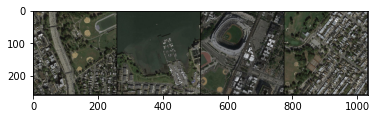

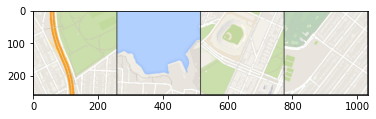

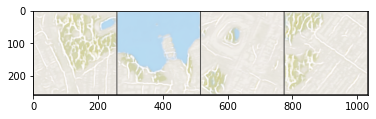

Epoch 5: Step 3200: Generator (U-Net) loss: 10.581845886707306, Discriminator loss: 0.40270415030419815


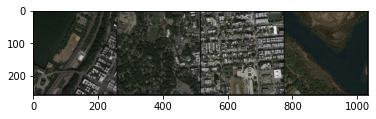

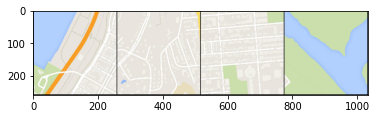

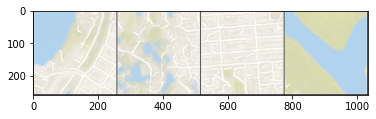

Epoch 6: Step 3400: Generator (U-Net) loss: 10.282672421932228, Discriminator loss: 0.3400522332824767


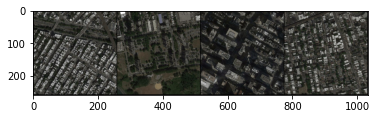

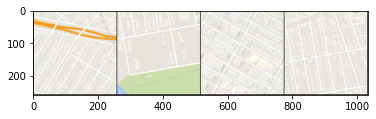

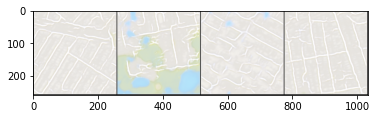

Epoch 6: Step 3600: Generator (U-Net) loss: 10.36444249868393, Discriminator loss: 0.3729957597330211


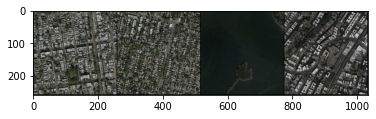

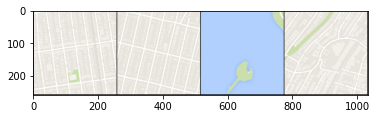

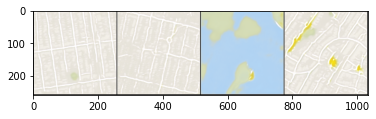

Epoch 6: Step 3800: Generator (U-Net) loss: 10.550451414585115, Discriminator loss: 0.34547798626124854


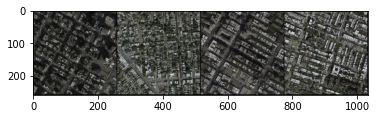

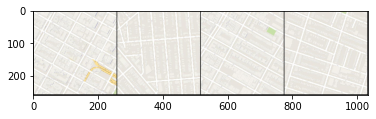

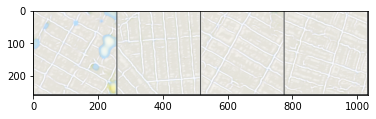

Epoch 7: Step 4000: Generator (U-Net) loss: 10.52360455274582, Discriminator loss: 0.38758133901283126


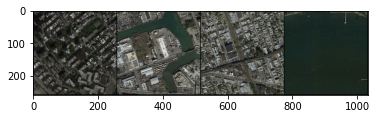

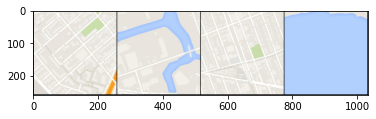

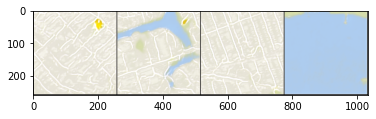

Epoch 7: Step 4200: Generator (U-Net) loss: 10.075112724304196, Discriminator loss: 0.343039575619623


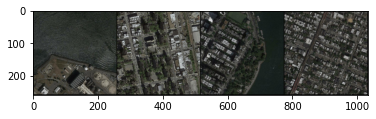

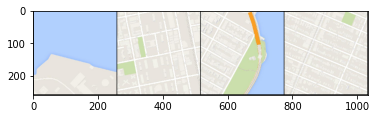

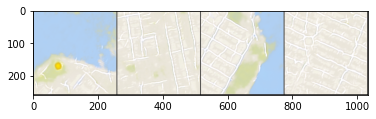

Epoch 8: Step 4400: Generator (U-Net) loss: 10.774432148933403, Discriminator loss: 0.3322085233964026


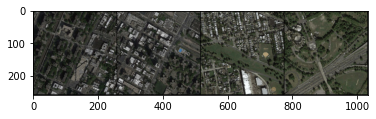

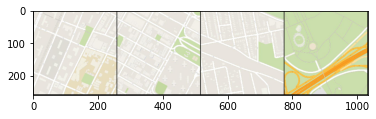

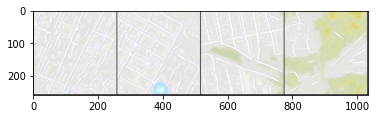

Epoch 8: Step 4600: Generator (U-Net) loss: 11.160464024543755, Discriminator loss: 0.29739801146090034


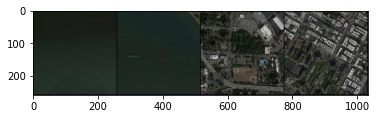

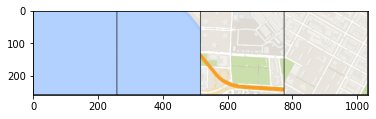

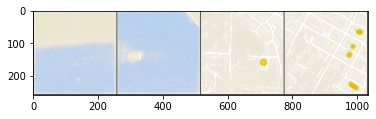

Epoch 8: Step 4800: Generator (U-Net) loss: 11.178814117908479, Discriminator loss: 0.31018290536478166


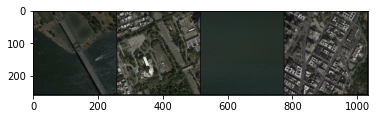

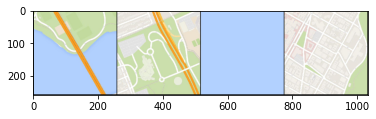

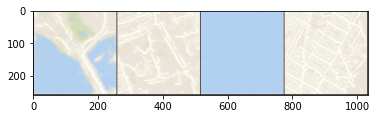

Epoch 9: Step 5000: Generator (U-Net) loss: 10.849905183315276, Discriminator loss: 0.2906914908625184


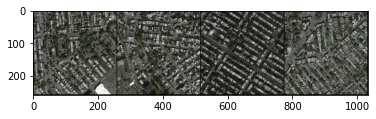

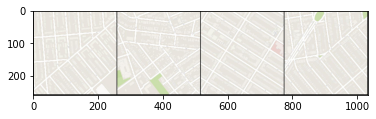

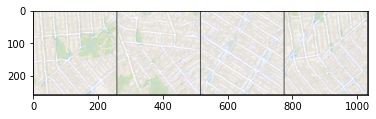

Epoch 9: Step 5200: Generator (U-Net) loss: 11.014477286338806, Discriminator loss: 0.2922625226154924


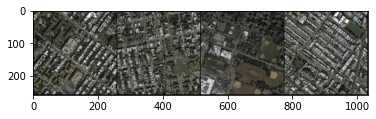

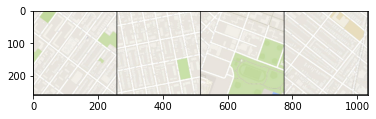

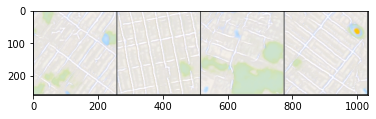

Epoch 9: Step 5400: Generator (U-Net) loss: 10.322941019535065, Discriminator loss: 0.2736430542916059


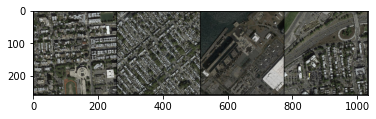

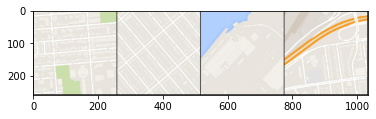

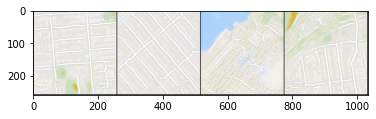

Epoch 10: Step 5600: Generator (U-Net) loss: 11.008454036712632, Discriminator loss: 0.30952700488269336


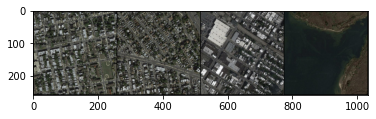

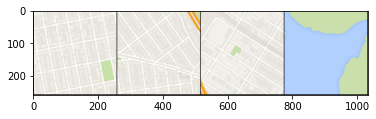

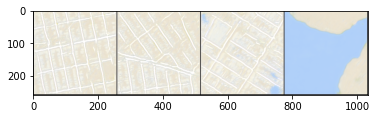

Epoch 10: Step 5800: Generator (U-Net) loss: 10.827447638511655, Discriminator loss: 0.3242656880430877


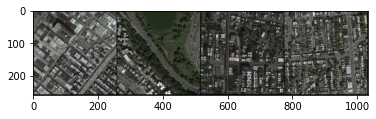

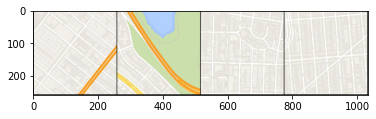

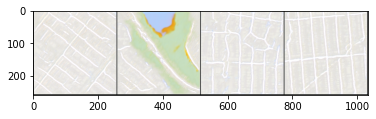

Epoch 10: Step 6000: Generator (U-Net) loss: 10.442935786247252, Discriminator loss: 0.2974115487560628


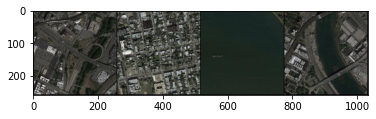

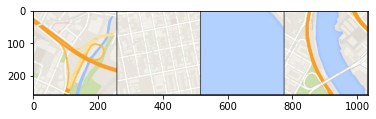

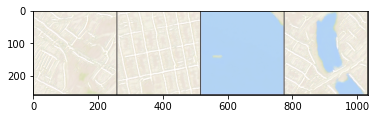

Epoch 11: Step 6200: Generator (U-Net) loss: 11.022920253276826, Discriminator loss: 0.2606891291216017


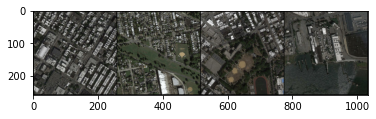

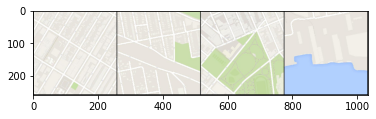

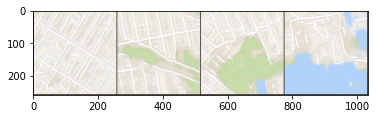

Epoch 11: Step 6400: Generator (U-Net) loss: 10.292111201286314, Discriminator loss: 0.3108080144040287


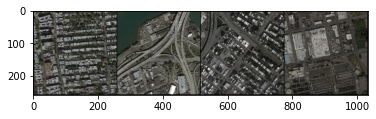

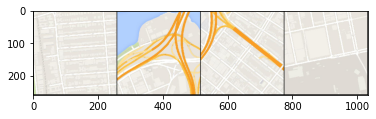

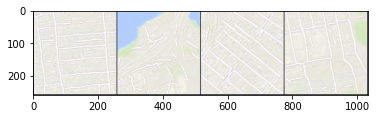

Epoch 12: Step 6600: Generator (U-Net) loss: 10.403538770675652, Discriminator loss: 0.35866096636280415


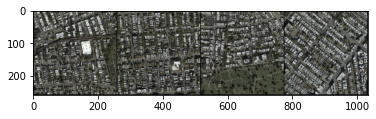

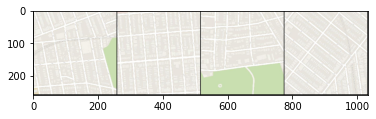

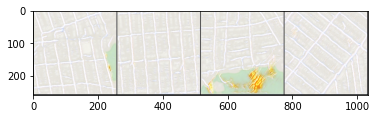

Epoch 12: Step 6800: Generator (U-Net) loss: 10.057943830490107, Discriminator loss: 0.3690548092126848


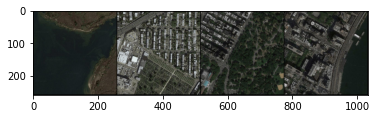

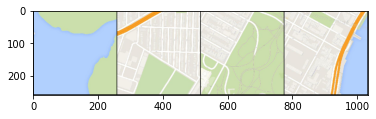

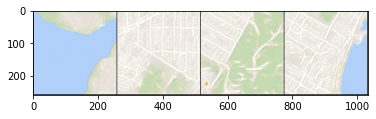

Epoch 12: Step 7000: Generator (U-Net) loss: 10.41100601673126, Discriminator loss: 0.3476235072314742


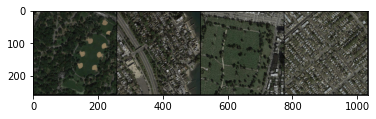

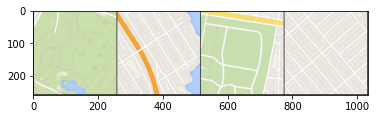

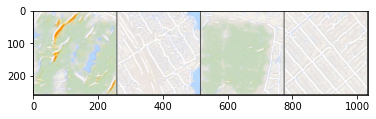

Epoch 13: Step 7200: Generator (U-Net) loss: 10.182802329063414, Discriminator loss: 0.36409670839086167


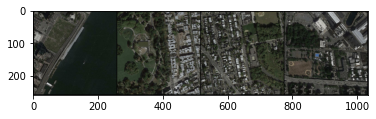

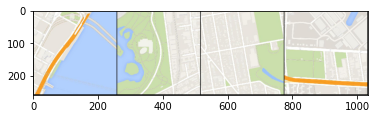

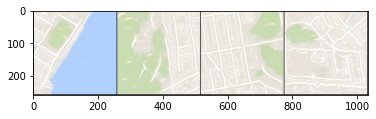

Epoch 13: Step 7400: Generator (U-Net) loss: 9.874377608299257, Discriminator loss: 0.3992284997366369


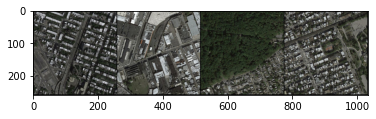

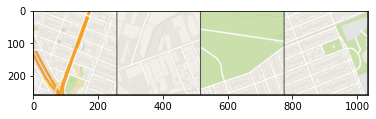

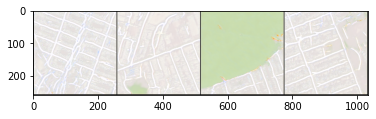

Epoch 13: Step 7600: Generator (U-Net) loss: 9.919108667373658, Discriminator loss: 0.40702542599290614


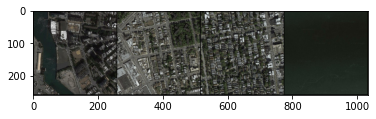

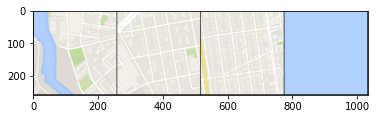

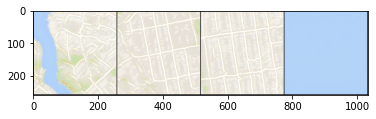

Epoch 14: Step 7800: Generator (U-Net) loss: 9.911169273853304, Discriminator loss: 0.3525662671960888


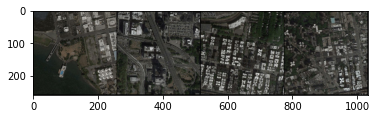

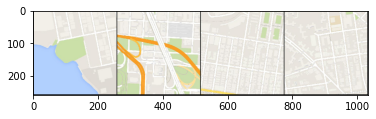

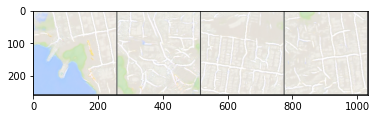

Epoch 14: Step 8000: Generator (U-Net) loss: 10.275683114528654, Discriminator loss: 0.3006002228241415


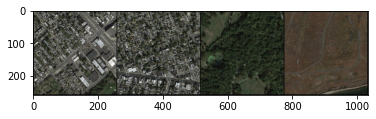

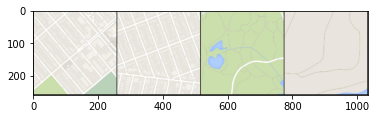

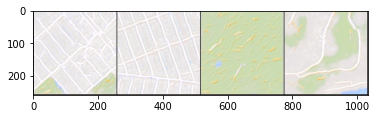

Epoch 14: Step 8200: Generator (U-Net) loss: 10.436412057876584, Discriminator loss: 0.32228247338905935


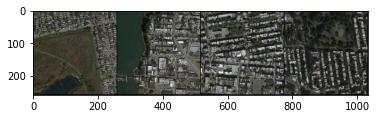

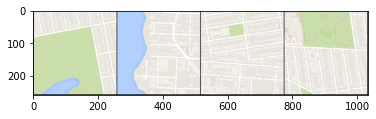

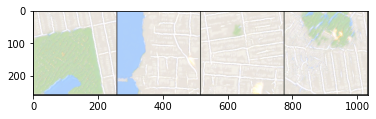

Epoch 15: Step 8400: Generator (U-Net) loss: 10.354556682109832, Discriminator loss: 0.29741713286377497


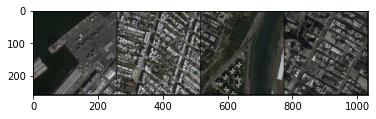

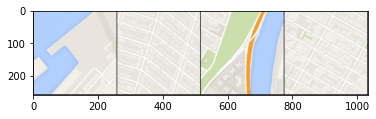

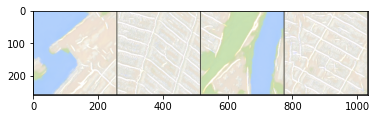

Epoch 15: Step 8600: Generator (U-Net) loss: 10.301588685512552, Discriminator loss: 0.33415134398266666


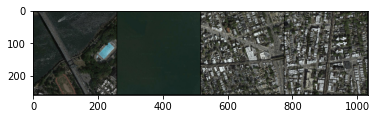

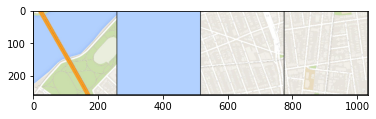

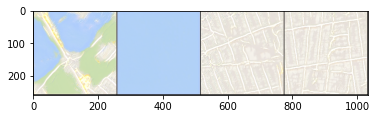

Epoch 16: Step 8800: Generator (U-Net) loss: 9.963257167339325, Discriminator loss: 0.3759048366174102


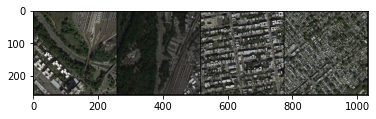

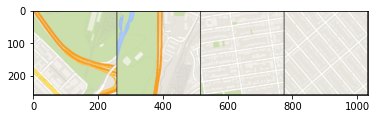

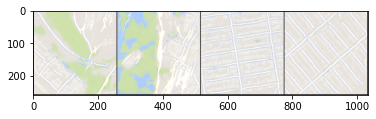

Epoch 16: Step 9000: Generator (U-Net) loss: 10.279909033775326, Discriminator loss: 0.421839626189321


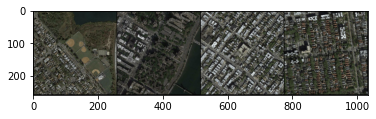

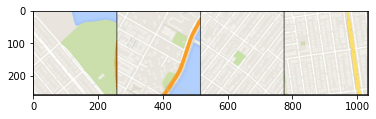

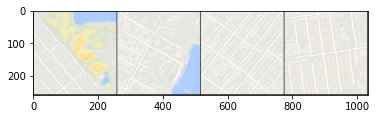

Epoch 16: Step 9200: Generator (U-Net) loss: 9.839416556358351, Discriminator loss: 0.3286620898358523


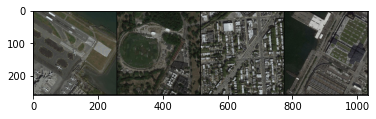

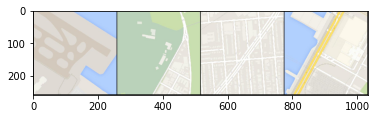

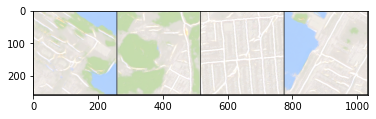

Epoch 17: Step 9400: Generator (U-Net) loss: 9.946312239170075, Discriminator loss: 0.3242691121343525


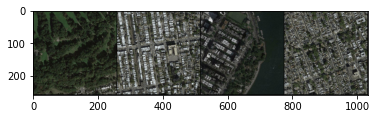

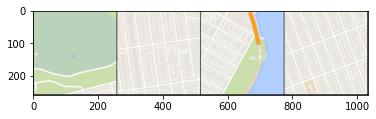

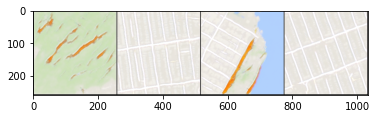

Epoch 17: Step 9600: Generator (U-Net) loss: 10.0083710026741, Discriminator loss: 0.3219341267272831


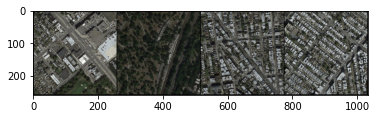

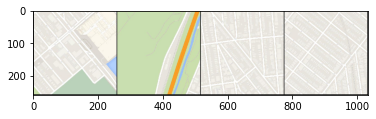

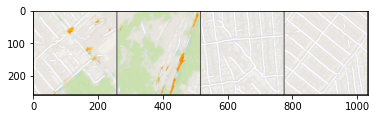

Epoch 17: Step 9800: Generator (U-Net) loss: 9.996930761337275, Discriminator loss: 0.2932644958700984


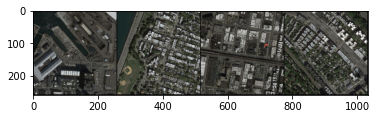

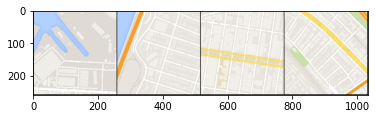

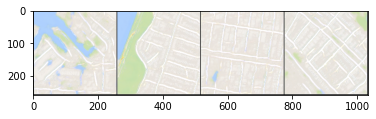

Epoch 18: Step 10000: Generator (U-Net) loss: 9.957191028594966, Discriminator loss: 0.31167771033011366


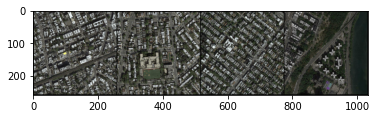

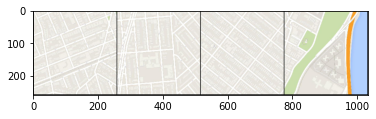

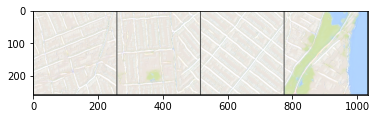

Epoch 18: Step 10200: Generator (U-Net) loss: 10.174843754768364, Discriminator loss: 0.2830086713470519


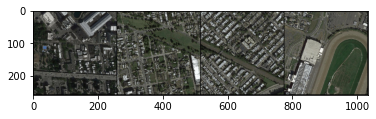

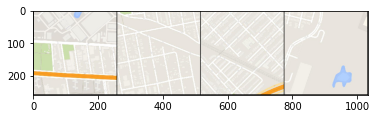

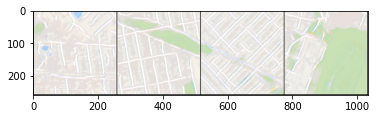

Epoch 18: Step 10400: Generator (U-Net) loss: 10.268340718746188, Discriminator loss: 0.27579520093277093


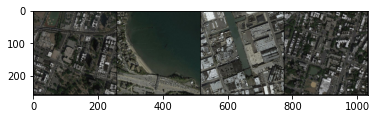

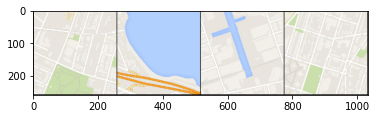

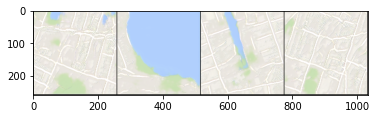

Epoch 19: Step 10600: Generator (U-Net) loss: 10.257356488704682, Discriminator loss: 0.24050201226957146


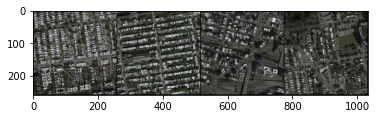

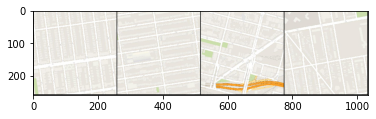

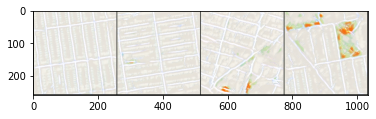

Epoch 19: Step 10800: Generator (U-Net) loss: 10.218364808559413, Discriminator loss: 0.27360962011851364


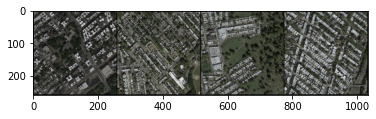

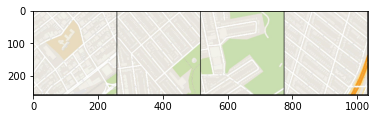

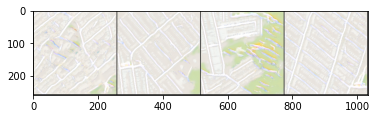

In [9]:
from skimage import color
import numpy as np
save_model = True
def train(save_model=True):
    mean_generator_loss = 0
    mean_discriminator_loss = 0
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    cur_step = 0

    for epoch in range(n_epochs):
        # Dataloader returns the batches
        for image, _ in tqdm(dataloader):
            image_width = image.shape[3]
            condition = image[:, :, :, :image_width // 2]
            condition = nn.functional.interpolate(condition, size=target_shape)
            real = image[:, :, :, image_width // 2:]
            real = nn.functional.interpolate(real, size=target_shape)
            cur_batch_size = len(condition)
            condition = condition.to(device)
            real = real.to(device)

            ### Update discriminator ###
            disc_opt.zero_grad() # Zero out the gradient before backpropagation
            with torch.no_grad():
                fake = gen(condition)
            disc_fake_hat = disc(fake.detach(), condition) # Detach generator
            disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
            disc_real_hat = disc(real, condition)
            disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
            disc_loss = (disc_fake_loss + disc_real_loss) / 2
            disc_loss.backward(retain_graph=True) # Update gradients
            disc_opt.step() # Update optimizer

            ### Update generator ###
            gen_opt.zero_grad()
            gen_loss = get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon)
            gen_loss.backward() # Update gradients
            gen_opt.step() # Update optimizer

            # Keep track of the average discriminator loss
            mean_discriminator_loss += disc_loss.item() / display_step
            # Keep track of the average generator loss
            mean_generator_loss += gen_loss.item() / display_step

            ### Visualization code ###
            if cur_step % display_step == 0:
                if cur_step > 0:
                    print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
                else:
                    print("Pretrained initial state")
                show_tensor_images(condition, size=(input_dim, target_shape, target_shape))
                show_tensor_images(real, size=(real_dim, target_shape, target_shape))
                show_tensor_images(fake, size=(real_dim, target_shape, target_shape))
                mean_generator_loss = 0
                mean_discriminator_loss = 0
            # You can change save_model to True if you'd like to save the model
            if save_model and cur_step%2000==0:
                 torch.save({'gen': gen.state_dict(),
                     'gen_opt': gen_opt.state_dict(),
                     'disc': disc.state_dict(),
                     'disc_opt': disc_opt.state_dict()
                  }, f"pix2pix_{cur_step}.pth")
            cur_step += 1
    if save_model and cur_step%2000==0:
                 torch.save({'gen': gen.state_dict(),
                     'gen_opt': gen_opt.state_dict(),
                     'disc': disc.state_dict(),
                     'disc_opt': disc_opt.state_dict()
                  }, f"pix2pix_{cur_step}.pth")
train()